In [ ]:
# Import all required libraries
import pennylane as qml
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import time
import sys
import os
from sklearn.datasets import make_moons
from sklearn.metrics import accuracy_score
from scipy import stats
from tqdm import tqdm
from matplotlib.colors import ListedColormap

# Add current directory to path for importing local modules
sys.path.append(os.path.dirname(os.path.abspath(__file__)) if '__file__' in globals() else os.getcwd())

# Import custom models
from models import (
    create_quantum_model, 
    train_quantum_model, 
    create_classical_nn, 
    train_classical_nn, 
    get_classical_models, 
    train_model
)

# Set random seeds 
np.random.seed(42)
torch.manual_seed(42)
os.makedirs('figures', exist_ok=True) # Store figures 

print("All libraries imported successfully")
print(f"Working directory: {os.getcwd()}")
print("Figures directory ready: figures/")

All libraries imported successfully
Working directory: d:\qnn-two-moon-problem
Figures directory ready: figures/


## 1. Quantum Architecture Exploration

Testing different quantum configurations to find the optimal architecture.


### 1.1 Setup Quantum Device


In [15]:
N_QUBITS = 2
backend = qml.device("default.qubit", wires=N_QUBITS)

In [16]:
QUANTUM_CONFIGS = [
    {'n_qubits': 2, 'n_layers': 2}, 
    {'n_qubits': 2, 'n_layers': 4}, 
    {'n_qubits': 2, 'n_layers': 6}, 
    {'n_qubits': 3, 'n_layers': 2}, 
    {'n_qubits': 3, 'n_layers': 4}, 
    {'n_qubits': 3, 'n_layers': 6}
]

quantum_arch_results = {}
print("\nQuantum architecture exploration")
print(f"Testing {len(QUANTUM_CONFIGS)} different quantum architectures with 1000 samples")
epochs_arch, batch_size_arch, n_samples = 10, 5, 1000
print(f"\nTesting architectures with {n_samples} samples")
x, y = make_moons(n_samples=n_samples, noise=0.1, random_state=42)
x, y = torch.tensor(x, dtype=torch.float32), torch.tensor(y, dtype=torch.long)
indices = torch.randperm(len(x))
x_shuffled, y_shuffled = x[indices], y[indices]
train_size = int(0.75 * len(x_shuffled))
x_train, x_val, y_train, y_val = x_shuffled[:train_size], x_shuffled[train_size:], y_shuffled[:train_size], y_shuffled[train_size:]
quantum_arch_results[n_samples] = {}
for config_idx, config in enumerate(QUANTUM_CONFIGS):
    n_qubits, n_layers = config['n_qubits'], config['n_layers']
    config_name = f"Q{n_qubits}L{n_layers}"
    print(f"\n[{config_idx+1}/{len(QUANTUM_CONFIGS)}] Testing {config_name} (Qubits={n_qubits}, Layers={n_layers})")
    try:
        create_start = time.time()
        model = create_quantum_model(n_qubits=n_qubits, n_layers=n_layers)
        create_time = time.time() - create_start
        model, history, train_time = train_quantum_model(model, x_train, y_train, x_val, y_val, epochs=epochs_arch, batch_size=batch_size_arch, lr=0.05)
        inference_start = time.time()
        with torch.no_grad():
            pred = model(x).argmax(dim=1).numpy()
        inference_time = time.time() - inference_start
        accuracy = accuracy_score(y.numpy(), pred)
        total_params = 2 + n_qubits * n_layers + 2
        quantum_arch_results[n_samples][config_name] = {'config': config, 'accuracy': accuracy, 'train_time': train_time, 'inference_time': inference_time, 'create_time': create_time, 'total_time': create_time + train_time + inference_time, 'history': history, 'predictions': pred, 'model': model, 'n_params_approx': total_params}
        print(f"  {config_name}: Accuracy={accuracy:.4f}, Time={train_time:.2f}s")
    except Exception as e:
        print(f"  {config_name}: Failed - {str(e)}")
        quantum_arch_results[n_samples][config_name] = {'config': config, 'error': str(e)}
print(f"\nCompleted architecture testing for {n_samples} samples")
results = quantum_arch_results[n_samples]
best_arch = max([(k, v) for k, v in results.items() if 'error' not in v], key=lambda x: x[1]['accuracy'])
print(f"\nBest Architecture: {best_arch[0]} with accuracy: {best_arch[1]['accuracy']:.4f}")


Quantum architecture exploration
Testing 6 different quantum architectures with 1000 samples

Testing architectures with 1000 samples

[1/6] Testing Q2L2 (Qubits=2, Layers=2)


Training Quantum NN: 100%|██████████| 10/10 [00:09<00:00,  1.03epoch/s]


  Q2L2: Accuracy=0.8830, Time=9.69s

[2/6] Testing Q2L4 (Qubits=2, Layers=4)


Training Quantum NN: 100%|██████████| 10/10 [00:12<00:00,  1.28s/epoch]


  Q2L4: Accuracy=0.8830, Time=12.85s

[3/6] Testing Q2L6 (Qubits=2, Layers=6)


Training Quantum NN: 100%|██████████| 10/10 [00:16<00:00,  1.67s/epoch]


  Q2L6: Accuracy=0.9930, Time=16.69s

[4/6] Testing Q3L2 (Qubits=3, Layers=2)


Training Quantum NN: 100%|██████████| 10/10 [00:13<00:00,  1.36s/epoch]


  Q3L2: Accuracy=0.9940, Time=13.58s

[5/6] Testing Q3L4 (Qubits=3, Layers=4)


Training Quantum NN: 100%|██████████| 10/10 [00:20<00:00,  2.02s/epoch]


  Q3L4: Accuracy=0.9890, Time=20.21s

[6/6] Testing Q3L6 (Qubits=3, Layers=6)


Training Quantum NN: 100%|██████████| 10/10 [00:26<00:00,  2.66s/epoch]

  Q3L6: Accuracy=0.8790, Time=26.56s

Completed architecture testing for 1000 samples

Best Architecture: Q3L2 with accuracy: 0.9940


## 2. Dataset Configuration

Define sample sizes and noise levels for experiments.

### 2.1 Define Parameters

In [17]:
SAMPLE_SIZES = [1000, 10000]
NOISE_LEVELS = [0.1, 0.5, 0.9]
print("Sample sizes to test:", SAMPLE_SIZES)
print("Noise levels to test:", NOISE_LEVELS)

Sample sizes to test: [1000, 10000]
Noise levels to test: [0.1, 0.5, 0.9]



n=1000, noise=0.1:
  Class 0: 500 samples (50.0%)
  Class 1: 500 samples (50.0%)

n=10000, noise=0.1:
  Class 0: 5000 samples (50.0%)
  Class 1: 5000 samples (50.0%)

n=1000, noise=0.5:
  Class 0: 500 samples (50.0%)
  Class 1: 500 samples (50.0%)

n=10000, noise=0.5:
  Class 0: 5000 samples (50.0%)
  Class 1: 5000 samples (50.0%)

n=1000, noise=0.9:
  Class 0: 500 samples (50.0%)
  Class 1: 500 samples (50.0%)

n=10000, noise=0.9:
  Class 0: 5000 samples (50.0%)
  Class 1: 5000 samples (50.0%)


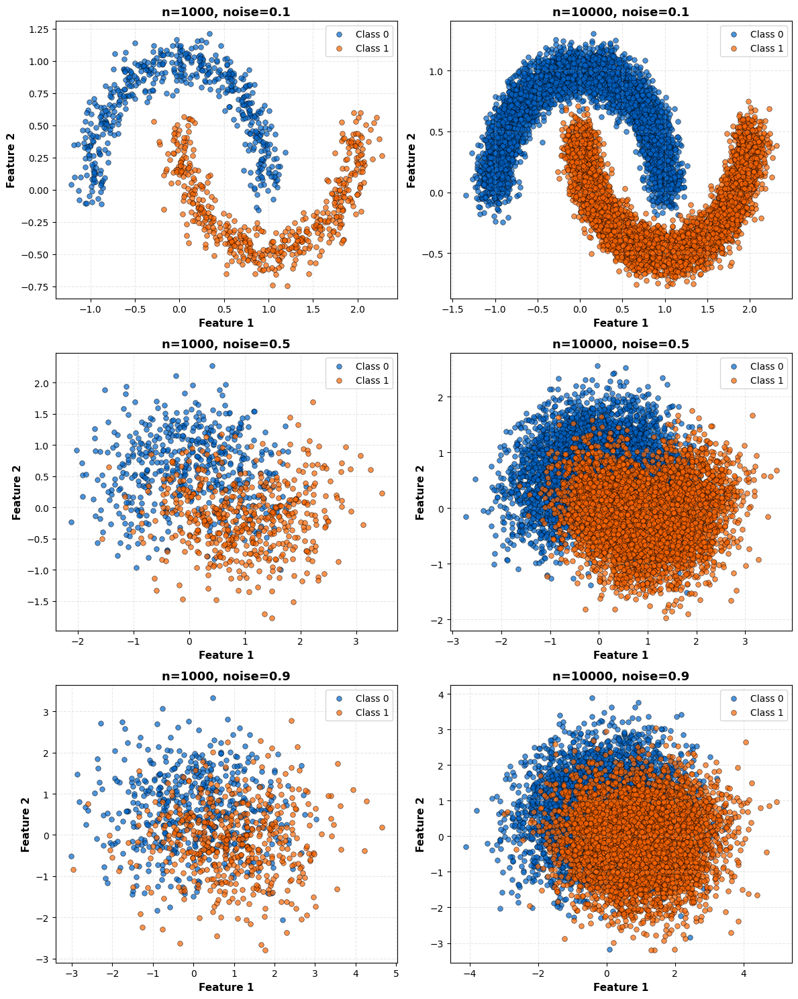

Saved: figures/dataset_distribution.png


In [18]:
fig, axes = plt.subplots(len(NOISE_LEVELS), len(SAMPLE_SIZES), figsize=(6 * len(SAMPLE_SIZES), 5 * len(NOISE_LEVELS)))
if len(NOISE_LEVELS) == 1 and len(SAMPLE_SIZES) == 1: 
    axes = np.array([[axes]])
elif len(NOISE_LEVELS) == 1: 
    axes = axes.reshape(1, -1)
elif len(SAMPLE_SIZES) == 1: 
    axes = axes.reshape(-1, 1)
for noise_idx, noise in enumerate(NOISE_LEVELS):
    for size_idx, n_samples in enumerate(SAMPLE_SIZES):
        X, y = make_moons(n_samples=n_samples, noise=noise, random_state=42)
        ax = axes[noise_idx, size_idx]
        colors = ['#0066CC', '#FF6600']
        for class_idx in [0, 1]:
            mask = y == class_idx
            ax.scatter(X[mask, 0], X[mask, 1], c=colors[class_idx], label=f'Class {class_idx}', alpha=0.7, edgecolor='black', linewidth=0.5, s=30)
        ax.set_title(f'n={n_samples}, noise={noise}', fontsize=13, fontweight='bold')
        ax.set_xlabel('Feature 1', fontsize=11, fontweight='bold')
        ax.set_ylabel('Feature 2', fontsize=11, fontweight='bold')
        ax.legend(fontsize=10)
        ax.grid(True, alpha=0.3, linestyle='--')
        unique, counts = np.unique(y, return_counts=True)
        print(f"\nn={n_samples}, noise={noise}:")
        for cls, count in zip(unique, counts):
            print(f"  Class {cls}: {count} samples ({100*count/n_samples:.1f}%)")
plt.tight_layout()
plt.savefig('figures/dataset_distribution.png', dpi=300, bbox_inches='tight')
plt.show()
print("Saved: figures/dataset_distribution.png")

### 2.2 Gaussian Distribution Analysis

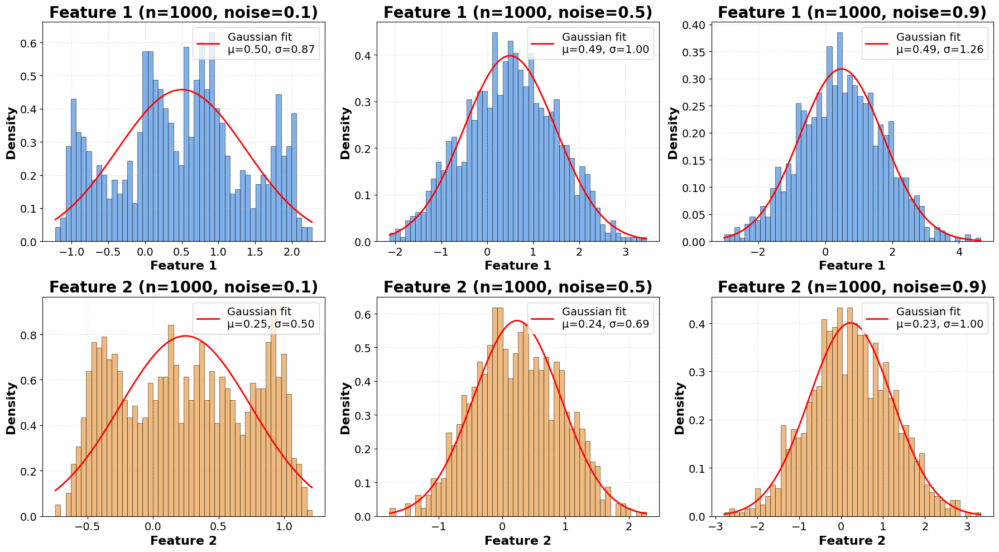

Saved: figures/gaussian_analysis_n1000.png


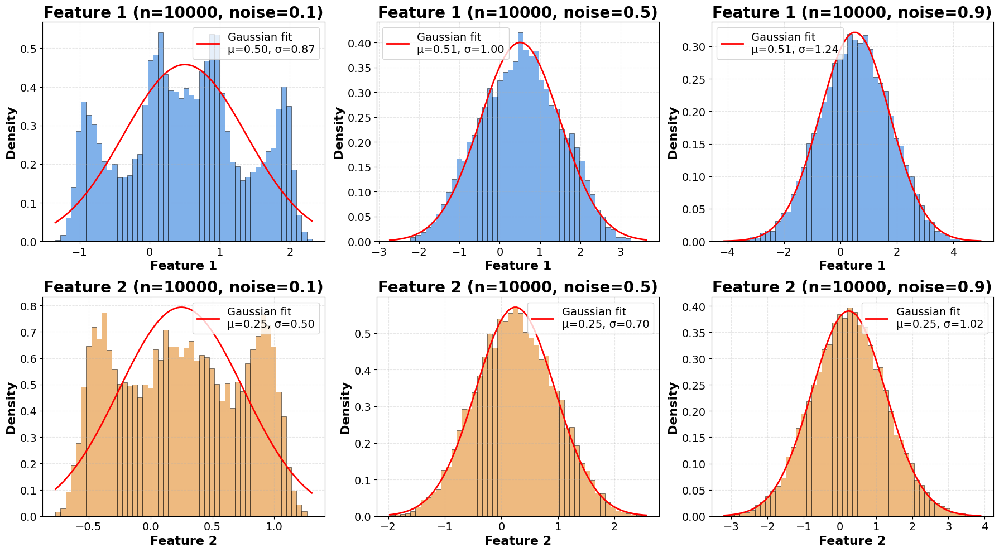

Saved: figures/gaussian_analysis_n10000.png


In [ ]:
# Tham số font size
TITLE_FONTSIZE = 20
LABEL_FONTSIZE = 16
LEGEND_FONTSIZE = 14
TICK_FONTSIZE = 14

# Tạo 2 figure riêng biệt cho mỗi sample size
for size_idx, n_samples in enumerate(SAMPLE_SIZES):
    fig, axes = plt.subplots(2, len(NOISE_LEVELS), figsize=(6 * len(NOISE_LEVELS), 10))
    
    # Xử lý trường hợp chỉ có 1 noise level
    if len(NOISE_LEVELS) == 1:
        axes = axes.reshape(2, 1)
    
    for noise_idx, noise in enumerate(NOISE_LEVELS):
        X, y = make_moons(n_samples=n_samples, noise=noise, random_state=42)
        
        # Feature 1 - Dòng 1
        ax1 = axes[0, noise_idx]
        feature1 = X[:, 0]
        counts, bins, patches = ax1.hist(feature1, bins=50, density=True, alpha=0.7, color='#4a90e2', edgecolor='black', linewidth=0.5)
        mu1, std1 = feature1.mean(), feature1.std()
        x_range = np.linspace(feature1.min(), feature1.max(), 100)
        gaussian1 = stats.norm.pdf(x_range, mu1, std1)
        ax1.plot(x_range, gaussian1, 'r-', linewidth=2, label=f'Gaussian fit\nμ={mu1:.2f}, σ={std1:.2f}')
        ax1.set_title(f'Feature 1 (n={n_samples}, noise={noise})', fontsize=TITLE_FONTSIZE, fontweight='bold')
        ax1.set_xlabel('Feature 1', fontsize=LABEL_FONTSIZE, fontweight='bold')
        ax1.set_ylabel('Density', fontsize=LABEL_FONTSIZE, fontweight='bold')
        ax1.legend(fontsize=LEGEND_FONTSIZE)
        ax1.tick_params(axis='both', which='major', labelsize=TICK_FONTSIZE)
        ax1.grid(True, alpha=0.3, linestyle='--')
        
        # Feature 2 - Dòng 2
        ax2 = axes[1, noise_idx]
        feature2 = X[:, 1]
        counts, bins, patches = ax2.hist(feature2, bins=50, density=True, alpha=0.7, color='#e89d4a', edgecolor='black', linewidth=0.5)
        mu2, std2 = feature2.mean(), feature2.std()
        x_range = np.linspace(feature2.min(), feature2.max(), 100)
        gaussian2 = stats.norm.pdf(x_range, mu2, std2)
        ax2.plot(x_range, gaussian2, 'r-', linewidth=2, label=f'Gaussian fit\nμ={mu2:.2f}, σ={std2:.2f}')
        ax2.set_title(f'Feature 2 (n={n_samples}, noise={noise})', fontsize=TITLE_FONTSIZE, fontweight='bold')
        ax2.set_xlabel('Feature 2', fontsize=LABEL_FONTSIZE, fontweight='bold')
        ax2.set_ylabel('Density', fontsize=LABEL_FONTSIZE, fontweight='bold')
        ax2.legend(fontsize=LEGEND_FONTSIZE)
        ax2.tick_params(axis='both', which='major', labelsize=TICK_FONTSIZE)
        ax2.grid(True, alpha=0.3, linestyle='--')
    
    plt.tight_layout()
    plt.savefig(f'figures/gaussian_analysis_n{n_samples}.png', dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Saved: figures/gaussian_analysis_n{n_samples}.png")

## 3. Quantum Circuit Definition

Define the quantum circuit and hybrid model architecture.

In [20]:
@qml.qnode(backend)
def qnode(inputs, weights):
    qml.templates.AngleEmbedding(inputs, wires=range(N_QUBITS))
    qml.templates.BasicEntanglerLayers(weights, wires=range(N_QUBITS))
    return [qml.expval(qml.PauliZ(wires=i)) for i in range(N_QUBITS)]
N_LAYERS = 6
weight_shapes = {"weights": (N_LAYERS, N_QUBITS)}
qlayer = qml.qnn.TorchLayer(qnode, weight_shapes)

In [21]:
class HybridModel(nn.Module):
    def __init__(self):
        super(HybridModel, self).__init__()
        self.input_layer = nn.Linear(2, 2)
        self.qlayer = qlayer
        self.output_layer = nn.Linear(2, 2)
    def forward(self, x):
        x = self.input_layer(x)
        x = self.qlayer(x)
        x = self.output_layer(x)
        return x
model = HybridModel()

## 4. Model Training and Comparison

Train quantum and classical models across all configurations.

In [ ]:
# Lấy cấu hình tốt nhất của QNN
best_quantum_config = max(
    [(k, v) for k, v in quantum_arch_results[1000].items() if 'error' not in v],
    key=lambda x: x[1]['accuracy']
)[1]['config']

print(f"\n{'='*80}")
print(f"Best Quantum Architecture: {best_quantum_config['n_qubits']} qubits, {best_quantum_config['n_layers']} layers")
print(f"{'='*80}")

# Lưu tất cả kết quả
all_experiments = {}

epochs = 10
batch_size = 5

total_configs = len(SAMPLE_SIZES) * len(NOISE_LEVELS)
config_counter = 0

for n_samples in SAMPLE_SIZES:
    for noise in NOISE_LEVELS:
        config_counter += 1
        config_name = f"{n_samples}_noise{noise}"
        
        print(f"\n{'#'*80}")
        print(f"# Config [{config_counter}/{total_configs}]: n={n_samples:,} samples | noise={noise}")
        print(f"{'#'*80}")
        
        # Gen data
        x, y = make_moons(n_samples=n_samples, noise=noise, random_state=42)
        x = torch.tensor(x, dtype=torch.float32)
        y = torch.tensor(y, dtype=torch.long)
        
        # Shuffle + split data
        indices = torch.randperm(len(x))
        x_shuffled = x[indices]
        y_shuffled = y[indices]
        train_size = int(0.75 * len(x_shuffled))
        x_train, x_val = x_shuffled[:train_size], x_shuffled[train_size:]
        y_train, y_val = y_shuffled[:train_size], y_shuffled[train_size:]
        
        # Prepare data 
        X_train = x_train.numpy()
        Y_train = y_train.numpy()
        X_all = x.numpy()
        Y_all = y.numpy()
        classical_models = {}
        results = {}
        
        # Train QNN với cấu hình tốt nhất
        print(f"\n{'─'*80}")
        print(f"Quantum NN (Qubits={best_quantum_config['n_qubits']}, Layers={best_quantum_config['n_layers']})")
        print(f"{'─'*80}")
        
        # Đo lường thời gian
        create_start = time.time()
        model = create_quantum_model(n_qubits=best_quantum_config['n_qubits'], 
                                    n_layers=best_quantum_config['n_layers'])
        create_time = time.time() - create_start
        
        # Train
        model, history, train_time = train_quantum_model(model, x_train, y_train, x_val, y_val,
                                                         epochs=epochs, batch_size=batch_size, lr=0.05)
        
        # Measure encoding/forward pass time (inference on training set)
        encoding_start = time.time()
        with torch.no_grad():
            _ = model(x_train)  
        encoding_time = time.time() - encoding_start
        # Estimate total encoding time during training (forward pass happens in each epoch)
        total_encoding_time = encoding_time * epochs
        pure_training_time = train_time - total_encoding_time  # Backward + optimization time
        
        # Measure inference time on full dataset
        inference_start = time.time()
        with torch.no_grad():
            qnn_pred = model(x).argmax(dim=1).numpy()
        inference_time = time.time() - inference_start
        
        qnn_accuracy = accuracy_score(Y_all, qnn_pred)
        
        results['Quantum NN'] = {
            'accuracy': qnn_accuracy,
            'time': train_time,  # Total training time
            'encoding_time': total_encoding_time,  # Encoding time during training
            'pure_training_time': pure_training_time,  # Backward + optimization only
            'create_time': create_time,
            'inference_time': inference_time,
            'total_time': create_time + train_time + inference_time,
            'predictions': qnn_pred,
            'history': history,
            'config': best_quantum_config  # Store config used
        }
        
        print(f"  Accuracy:     {qnn_accuracy:.4f} ({qnn_accuracy*100:.2f}%)")
        print(f"  Training:     {train_time:.2f}s")
        print(f"    - Encoding:  {total_encoding_time:.2f}s ({100*total_encoding_time/train_time:.1f}%)")
        print(f"    - Pure Train: {pure_training_time:.2f}s ({100*pure_training_time/train_time:.1f}%)")
        print(f"  Inference:    {inference_time:.2f}s")
        print(f"  Total:        {results['Quantum NN']['total_time']:.2f}s")
        
        # Train Classical NN (from scratch)
        print(f"\n{'─'*80}")
        print(f"Classical NN")
        print(f"{'─'*80}")
        start_time = time.time()
        
        classical_nn_model = create_classical_nn()
        classical_nn_model, cnn_history = train_classical_nn(classical_nn_model, x_train, y_train, x_val, y_val,
                                                             epochs=epochs, batch_size=batch_size, lr=0.05)
        
        cnn_time = time.time() - start_time
        
        with torch.no_grad():
            cnn_pred = classical_nn_model(x).argmax(dim=1).numpy()
        cnn_accuracy = accuracy_score(Y_all, cnn_pred)
        
        results['Classical NN'] = {
            'accuracy': cnn_accuracy,
            'time': cnn_time,
            'predictions': cnn_pred,
            'history': cnn_history
        }
        classical_models['Classical NN'] = classical_nn_model
        
        print(f"  Accuracy: {cnn_accuracy:.4f} ({cnn_accuracy*100:.2f}%)")
        print(f"  Time:     {cnn_time:.2f}s")
        
        # Train all other models (from scratch)
        print(f"\n{'─'*80}")
        print(f"Other Models")
        print(f"{'─'*80}")
        
        model_factories = get_classical_models()
        
        for idx, (model_name, model_factory) in enumerate(model_factories.items(), 1):
            print(f"\n  [{idx}/{len(model_factories)}] {model_name}...")
            start_time = time.time()
            
            # Create model from scratch
            mdl = model_factory()
            mdl, history = train_model(mdl, x_train, y_train, x_val, y_val,
                                       epochs=epochs, batch_size=batch_size, lr=0.05, 
                                       desc=f'Training {model_name}')
            
            train_time = time.time() - start_time
            
            # Predictions
            with torch.no_grad():
                pred = mdl(x).argmax(dim=1).numpy()
            accuracy = accuracy_score(Y_all, pred)
            
            classical_models[model_name] = mdl
            results[model_name] = {
                'accuracy': accuracy,
                'time': train_time,
                'predictions': pred,
                'history': history
            }
            
            print(f"      Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%) | Time: {train_time:.2f}s")
        
        # Lưu kết quả
        all_experiments[config_name] = {
            'n_samples': n_samples,
            'noise': noise,
            'data': (x, y, X_all, Y_all),
            'models': classical_models,
            'results': results,
            'qnn_model': model
        }
        
        # Tóm tắt của cấu hình này
        print(f"\n{'─'*80}")
        print(f"Summary for n={n_samples:,}, noise={noise}")
        print(f"{'─'*80}")
        best_model = max(results.items(), key=lambda x: x[1]['accuracy'])
        print(f"  Best Model: {best_model[0]} - Accuracy: {best_model[1]['accuracy']:.4f}")
        print(f"  Fastest:    {min(results.items(), key=lambda x: x[1]['time'])[0]} - Time: {min(results.items(), key=lambda x: x[1]['time'])[1]['time']:.2f}s")

print(f"\n{'='*80}")
print(f"All Experiments Completed!")
print(f"{'='*80}")
print(f"  Total Configurations: {total_configs}")
print(f"  Models per Config:    {len(results)}")
print(f"  Total Runs:          {total_configs * len(results)}")
print(f"{'='*80}\n")


Best Quantum Architecture: 3 qubits, 2 layers

################################################################################
# Config [1/6]: n=1,000 samples | noise=0.1
################################################################################

────────────────────────────────────────────────────────────────────────────────
Quantum NN (Qubits=3, Layers=2)
────────────────────────────────────────────────────────────────────────────────


Training Quantum NN: 100%|██████████| 10/10 [00:13<00:00,  1.40s/epoch]


  Accuracy:     0.8760 (87.60%)
  Training:     13.98s
    - Encoding:  0.11s (0.8%)
    - Pure Train: 13.87s (99.2%)
  Inference:    0.01s
  Total:        13.99s

────────────────────────────────────────────────────────────────────────────────
Classical NN
────────────────────────────────────────────────────────────────────────────────


Training Classical NN: 100%|██████████| 10/10 [00:00<00:00, 10.40epoch/s]


  Accuracy: 0.9990 (99.90%)
  Time:     0.96s

────────────────────────────────────────────────────────────────────────────────
Other Models
────────────────────────────────────────────────────────────────────────────────

  [1/6] Logistic Regression...


Training Logistic Regression: 100%|██████████| 10/10 [00:00<00:00, 19.93epoch/s]


      Accuracy: 0.8770 (87.70%) | Time: 0.50s

  [2/6] SVM...


Training SVM: 100%|██████████| 10/10 [00:00<00:00, 12.34epoch/s]


      Accuracy: 0.9980 (99.80%) | Time: 0.81s

  [3/6] Decision Tree...


Training Decision Tree: 100%|██████████| 10/10 [00:01<00:00,  9.84epoch/s]


      Accuracy: 0.9990 (99.90%) | Time: 1.02s

  [4/6] Random Forest...


Training Random Forest: 100%|██████████| 10/10 [00:04<00:00,  2.42epoch/s]


      Accuracy: 1.0000 (100.00%) | Time: 4.13s

  [5/6] Naive Bayes...


Training Naive Bayes: 100%|██████████| 10/10 [00:00<00:00, 13.95epoch/s]


      Accuracy: 0.9920 (99.20%) | Time: 0.72s

  [6/6] AdaBoost...


Training AdaBoost: 100%|██████████| 10/10 [00:04<00:00,  2.45epoch/s]


      Accuracy: 0.9990 (99.90%) | Time: 4.09s

────────────────────────────────────────────────────────────────────────────────
Summary for n=1,000, noise=0.1
────────────────────────────────────────────────────────────────────────────────
  Best Model: Random Forest - Accuracy: 1.0000
  Fastest:    Logistic Regression - Time: 0.50s

################################################################################
# Config [2/6]: n=1,000 samples | noise=0.5
################################################################################

────────────────────────────────────────────────────────────────────────────────
Quantum NN (Qubits=3, Layers=2)
────────────────────────────────────────────────────────────────────────────────


Training Quantum NN: 100%|██████████| 10/10 [00:13<00:00,  1.39s/epoch]


  Accuracy:     0.7810 (78.10%)
  Training:     13.87s
    - Encoding:  0.07s (0.5%)
    - Pure Train: 13.80s (99.5%)
  Inference:    0.01s
  Total:        13.88s

────────────────────────────────────────────────────────────────────────────────
Classical NN
────────────────────────────────────────────────────────────────────────────────


Training Classical NN: 100%|██████████| 10/10 [00:01<00:00,  9.87epoch/s]


  Accuracy: 0.8030 (80.30%)
  Time:     1.02s

────────────────────────────────────────────────────────────────────────────────
Other Models
────────────────────────────────────────────────────────────────────────────────

  [1/6] Logistic Regression...


Training Logistic Regression: 100%|██████████| 10/10 [00:00<00:00, 20.98epoch/s]


      Accuracy: 0.7780 (77.80%) | Time: 0.48s

  [2/6] SVM...


Training SVM: 100%|██████████| 10/10 [00:00<00:00, 12.13epoch/s]


      Accuracy: 0.7930 (79.30%) | Time: 0.83s

  [3/6] Decision Tree...


Training Decision Tree: 100%|██████████| 10/10 [00:00<00:00, 10.42epoch/s]


      Accuracy: 0.7940 (79.40%) | Time: 0.96s

  [4/6] Random Forest...


Training Random Forest: 100%|██████████| 10/10 [00:04<00:00,  2.43epoch/s]


      Accuracy: 0.8080 (80.80%) | Time: 4.12s

  [5/6] Naive Bayes...


Training Naive Bayes: 100%|██████████| 10/10 [00:00<00:00, 13.11epoch/s]


      Accuracy: 0.7990 (79.90%) | Time: 0.77s

  [6/6] AdaBoost...


Training AdaBoost: 100%|██████████| 10/10 [00:03<00:00,  2.51epoch/s]


      Accuracy: 0.8050 (80.50%) | Time: 3.99s

────────────────────────────────────────────────────────────────────────────────
Summary for n=1,000, noise=0.5
────────────────────────────────────────────────────────────────────────────────
  Best Model: Random Forest - Accuracy: 0.8080
  Fastest:    Logistic Regression - Time: 0.48s

################################################################################
# Config [3/6]: n=1,000 samples | noise=0.9
################################################################################

────────────────────────────────────────────────────────────────────────────────
Quantum NN (Qubits=3, Layers=2)
────────────────────────────────────────────────────────────────────────────────


Training Quantum NN: 100%|██████████| 10/10 [00:13<00:00,  1.37s/epoch]


  Accuracy:     0.6630 (66.30%)
  Training:     13.68s
    - Encoding:  0.09s (0.7%)
    - Pure Train: 13.59s (99.3%)
  Inference:    0.01s
  Total:        13.69s

────────────────────────────────────────────────────────────────────────────────
Classical NN
────────────────────────────────────────────────────────────────────────────────


Training Classical NN: 100%|██████████| 10/10 [00:00<00:00, 10.70epoch/s]


  Accuracy: 0.5000 (50.00%)
  Time:     0.94s

────────────────────────────────────────────────────────────────────────────────
Other Models
────────────────────────────────────────────────────────────────────────────────

  [1/6] Logistic Regression...


Training Logistic Regression: 100%|██████████| 10/10 [00:00<00:00, 19.86epoch/s]


      Accuracy: 0.7140 (71.40%) | Time: 0.51s

  [2/6] SVM...


Training SVM: 100%|██████████| 10/10 [00:00<00:00, 13.45epoch/s]


      Accuracy: 0.6750 (67.50%) | Time: 0.75s

  [3/6] Decision Tree...


Training Decision Tree: 100%|██████████| 10/10 [00:00<00:00, 11.04epoch/s]


      Accuracy: 0.6850 (68.50%) | Time: 0.91s

  [4/6] Random Forest...


Training Random Forest: 100%|██████████| 10/10 [00:04<00:00,  2.40epoch/s]


      Accuracy: 0.7120 (71.20%) | Time: 4.17s

  [5/6] Naive Bayes...


Training Naive Bayes: 100%|██████████| 10/10 [00:00<00:00, 12.94epoch/s]


      Accuracy: 0.6780 (67.80%) | Time: 0.78s

  [6/6] AdaBoost...


Training AdaBoost: 100%|██████████| 10/10 [00:04<00:00,  2.47epoch/s]


      Accuracy: 0.7030 (70.30%) | Time: 4.05s

────────────────────────────────────────────────────────────────────────────────
Summary for n=1,000, noise=0.9
────────────────────────────────────────────────────────────────────────────────
  Best Model: Logistic Regression - Accuracy: 0.7140
  Fastest:    Logistic Regression - Time: 0.51s

################################################################################
# Config [4/6]: n=10,000 samples | noise=0.1
################################################################################

────────────────────────────────────────────────────────────────────────────────
Quantum NN (Qubits=3, Layers=2)
────────────────────────────────────────────────────────────────────────────────


Training Quantum NN: 100%|██████████| 10/10 [02:13<00:00, 13.38s/epoch]


  Accuracy:     0.9992 (99.92%)
  Training:     133.83s
    - Encoding:  0.15s (0.1%)
    - Pure Train: 133.68s (99.9%)
  Inference:    0.02s
  Total:        133.85s

────────────────────────────────────────────────────────────────────────────────
Classical NN
────────────────────────────────────────────────────────────────────────────────


Training Classical NN: 100%|██████████| 10/10 [00:09<00:00,  1.06epoch/s]


  Accuracy: 0.9950 (99.50%)
  Time:     9.47s

────────────────────────────────────────────────────────────────────────────────
Other Models
────────────────────────────────────────────────────────────────────────────────

  [1/6] Logistic Regression...


Training Logistic Regression: 100%|██████████| 10/10 [00:05<00:00,  1.97epoch/s]


      Accuracy: 0.8850 (88.50%) | Time: 5.07s

  [2/6] SVM...


Training SVM: 100%|██████████| 10/10 [00:07<00:00,  1.35epoch/s]


      Accuracy: 0.9950 (99.50%) | Time: 7.43s

  [3/6] Decision Tree...


Training Decision Tree: 100%|██████████| 10/10 [00:09<00:00,  1.08epoch/s]


      Accuracy: 0.9985 (99.85%) | Time: 9.29s

  [4/6] Random Forest...


Training Random Forest: 100%|██████████| 10/10 [00:41<00:00,  4.13s/epoch]


      Accuracy: 0.9979 (99.79%) | Time: 41.30s

  [5/6] Naive Bayes...


Training Naive Bayes: 100%|██████████| 10/10 [00:07<00:00,  1.36epoch/s]


      Accuracy: 0.9631 (96.31%) | Time: 7.38s

  [6/6] AdaBoost...


Training AdaBoost: 100%|██████████| 10/10 [00:41<00:00,  4.11s/epoch]


      Accuracy: 0.9901 (99.01%) | Time: 41.10s

────────────────────────────────────────────────────────────────────────────────
Summary for n=10,000, noise=0.1
────────────────────────────────────────────────────────────────────────────────
  Best Model: Quantum NN - Accuracy: 0.9992
  Fastest:    Logistic Regression - Time: 5.07s

################################################################################
# Config [5/6]: n=10,000 samples | noise=0.5
################################################################################

────────────────────────────────────────────────────────────────────────────────
Quantum NN (Qubits=3, Layers=2)
────────────────────────────────────────────────────────────────────────────────


Training Quantum NN: 100%|██████████| 10/10 [02:10<00:00, 13.01s/epoch]


  Accuracy:     0.8195 (81.95%)
  Training:     130.09s
    - Encoding:  0.14s (0.1%)
    - Pure Train: 129.95s (99.9%)
  Inference:    0.01s
  Total:        130.10s

────────────────────────────────────────────────────────────────────────────────
Classical NN
────────────────────────────────────────────────────────────────────────────────


Training Classical NN: 100%|██████████| 10/10 [00:08<00:00,  1.13epoch/s]


  Accuracy: 0.8171 (81.71%)
  Time:     8.85s

────────────────────────────────────────────────────────────────────────────────
Other Models
────────────────────────────────────────────────────────────────────────────────

  [1/6] Logistic Regression...


Training Logistic Regression: 100%|██████████| 10/10 [00:04<00:00,  2.14epoch/s]


      Accuracy: 0.8063 (80.63%) | Time: 4.68s

  [2/6] SVM...


Training SVM: 100%|██████████| 10/10 [00:07<00:00,  1.41epoch/s]


      Accuracy: 0.8193 (81.93%) | Time: 7.11s

  [3/6] Decision Tree...


Training Decision Tree: 100%|██████████| 10/10 [00:09<00:00,  1.08epoch/s]


      Accuracy: 0.8132 (81.32%) | Time: 9.29s

  [4/6] Random Forest...


Training Random Forest: 100%|██████████| 10/10 [00:39<00:00,  4.00s/epoch]


      Accuracy: 0.8221 (82.21%) | Time: 39.99s

  [5/6] Naive Bayes...


Training Naive Bayes: 100%|██████████| 10/10 [00:07<00:00,  1.42epoch/s]


      Accuracy: 0.8092 (80.92%) | Time: 7.05s

  [6/6] AdaBoost...


Training AdaBoost: 100%|██████████| 10/10 [00:40<00:00,  4.02s/epoch]


      Accuracy: 0.8218 (82.18%) | Time: 40.22s

────────────────────────────────────────────────────────────────────────────────
Summary for n=10,000, noise=0.5
────────────────────────────────────────────────────────────────────────────────
  Best Model: Random Forest - Accuracy: 0.8221
  Fastest:    Logistic Regression - Time: 4.68s

################################################################################
# Config [6/6]: n=10,000 samples | noise=0.9
################################################################################

────────────────────────────────────────────────────────────────────────────────
Quantum NN (Qubits=3, Layers=2)
────────────────────────────────────────────────────────────────────────────────


Training Quantum NN: 100%|██████████| 10/10 [02:09<00:00, 12.98s/epoch]


  Accuracy:     0.7176 (71.76%)
  Training:     129.81s
    - Encoding:  0.10s (0.1%)
    - Pure Train: 129.72s (99.9%)
  Inference:    0.01s
  Total:        129.82s

────────────────────────────────────────────────────────────────────────────────
Classical NN
────────────────────────────────────────────────────────────────────────────────


Training Classical NN: 100%|██████████| 10/10 [00:08<00:00,  1.15epoch/s]


  Accuracy: 0.7023 (70.23%)
  Time:     8.68s

────────────────────────────────────────────────────────────────────────────────
Other Models
────────────────────────────────────────────────────────────────────────────────

  [1/6] Logistic Regression...


Training Logistic Regression: 100%|██████████| 10/10 [00:04<00:00,  2.15epoch/s]


      Accuracy: 0.7252 (72.52%) | Time: 4.65s

  [2/6] SVM...


Training SVM: 100%|██████████| 10/10 [00:07<00:00,  1.39epoch/s]


      Accuracy: 0.7089 (70.89%) | Time: 7.17s

  [3/6] Decision Tree...


Training Decision Tree: 100%|██████████| 10/10 [00:09<00:00,  1.10epoch/s]


      Accuracy: 0.7094 (70.94%) | Time: 9.08s

  [4/6] Random Forest...


Training Random Forest: 100%|██████████| 10/10 [00:40<00:00,  4.04s/epoch]


      Accuracy: 0.7262 (72.62%) | Time: 40.41s

  [5/6] Naive Bayes...


Training Naive Bayes: 100%|██████████| 10/10 [00:06<00:00,  1.48epoch/s]


      Accuracy: 0.7237 (72.37%) | Time: 6.76s

  [6/6] AdaBoost...


Training AdaBoost: 100%|██████████| 10/10 [00:40<00:00,  4.08s/epoch]

      Accuracy: 0.7268 (72.68%) | Time: 40.77s

────────────────────────────────────────────────────────────────────────────────
Summary for n=10,000, noise=0.9
────────────────────────────────────────────────────────────────────────────────
  Best Model: AdaBoost - Accuracy: 0.7268
  Fastest:    Logistic Regression - Time: 4.65s

All Experiments Completed!
  Total Configurations: 6
  Models per Config:    8
  Total Runs:          48



In [ ]:
# Chi tiết thời gian Encoding + Training + Inference của QNN
print("\nQuantum NN time breakdown")

for n_samples in SAMPLE_SIZES:
    for noise in NOISE_LEVELS:
        config_name = f"{n_samples}_noise{noise}"
        qnn_data = all_experiments[config_name]['results']['Quantum NN']
        
        print(f"\nSample Size: {n_samples}, Noise: {noise}")
        print(f"  Model Creation:      {qnn_data['create_time']:.3f}s")
        print(f"  Training Total:      {qnn_data['time']:.3f}s")
        print(f"    Encoding:          {qnn_data['encoding_time']:.3f}s ({100*qnn_data['encoding_time']/qnn_data['time']:.1f}%)")
        print(f"    Pure Training:     {qnn_data['pure_training_time']:.3f}s ({100*qnn_data['pure_training_time']/qnn_data['time']:.1f}%)")
        print(f"  Inference:           {qnn_data['inference_time']:.3f}s")
        print(f"  Total:               {qnn_data['total_time']:.3f}s")


Quantum NN time breakdown

Sample Size: 1000, Noise: 0.1
  Model Creation:      0.000s
  Training Total:      13.977s
    Encoding:          0.105s (0.8%)
    Pure Training:     13.872s (99.2%)
  Inference:           0.009s
  Total:               13.986s

Sample Size: 1000, Noise: 0.5
  Model Creation:      0.001s
  Training Total:      13.868s
    Encoding:          0.068s (0.5%)
    Pure Training:     13.800s (99.5%)
  Inference:           0.007s
  Total:               13.876s

Sample Size: 1000, Noise: 0.9
  Model Creation:      0.001s
  Training Total:      13.680s
    Encoding:          0.090s (0.7%)
    Pure Training:     13.590s (99.3%)
  Inference:           0.006s
  Total:               13.686s

Sample Size: 10000, Noise: 0.1
  Model Creation:      0.000s
  Training Total:      133.833s
    Encoding:          0.151s (0.1%)
    Pure Training:     133.682s (99.9%)
  Inference:           0.020s
  Total:               133.853s

Sample Size: 10000, Noise: 0.5
  Model Creation:    

### Training History

In [ ]:
for n_samples in SAMPLE_SIZES:
    for noise in NOISE_LEVELS:
        config_name = f"{n_samples}_noise{noise}"
        results = all_experiments[config_name]['results']
        
        print(f"\nSample Size: {n_samples}, Noise: {noise}")
        
        summary_data = []
        for model_name in results.keys():
            accuracy = results[model_name]['accuracy']
            training_time = results[model_name].get('time', 'N/A')
            
            summary_data.append({
                'Model': model_name,
                'Accuracy': f"{accuracy:.4f}",
                'Time (s)': f"{training_time:.3f}" if training_time != 'N/A' else 'N/A'
            })
        
        df = pd.DataFrame(summary_data)
        df = df.sort_values('Accuracy', ascending=False).reset_index(drop=True)
        print(df.to_string(index=False))
        
        # Find model tốt nhất
        best_model = max(results.items(), key=lambda x: x[1]['accuracy'])
        print(f"\nBest: {best_model[0]} ({best_model[1]['accuracy']:.4f})")


Summary: Model performance across different configurations

Sample Size: 1000, Noise: 0.1
              Model Accuracy Time (s)
      Random Forest   1.0000    4.129
       Classical NN   0.9990    0.965
      Decision Tree   0.9990    1.019
           AdaBoost   0.9990    4.090
                SVM   0.9980    0.813
        Naive Bayes   0.9920    0.719
Logistic Regression   0.8770    0.505
         Quantum NN   0.8760   13.977

Best: Random Forest (1.0000)

Sample Size: 1000, Noise: 0.5
              Model Accuracy Time (s)
      Random Forest   0.8080    4.118
           AdaBoost   0.8050    3.990
       Classical NN   0.8030    1.016
        Naive Bayes   0.7990    0.766
      Decision Tree   0.7940    0.963
                SVM   0.7930    0.828
         Quantum NN   0.7810   13.868
Logistic Regression   0.7780    0.479

Best: Random Forest (0.8080)

Sample Size: 1000, Noise: 0.9
              Model Accuracy Time (s)
Logistic Regression   0.7140    0.507
      Random Forest   0.712

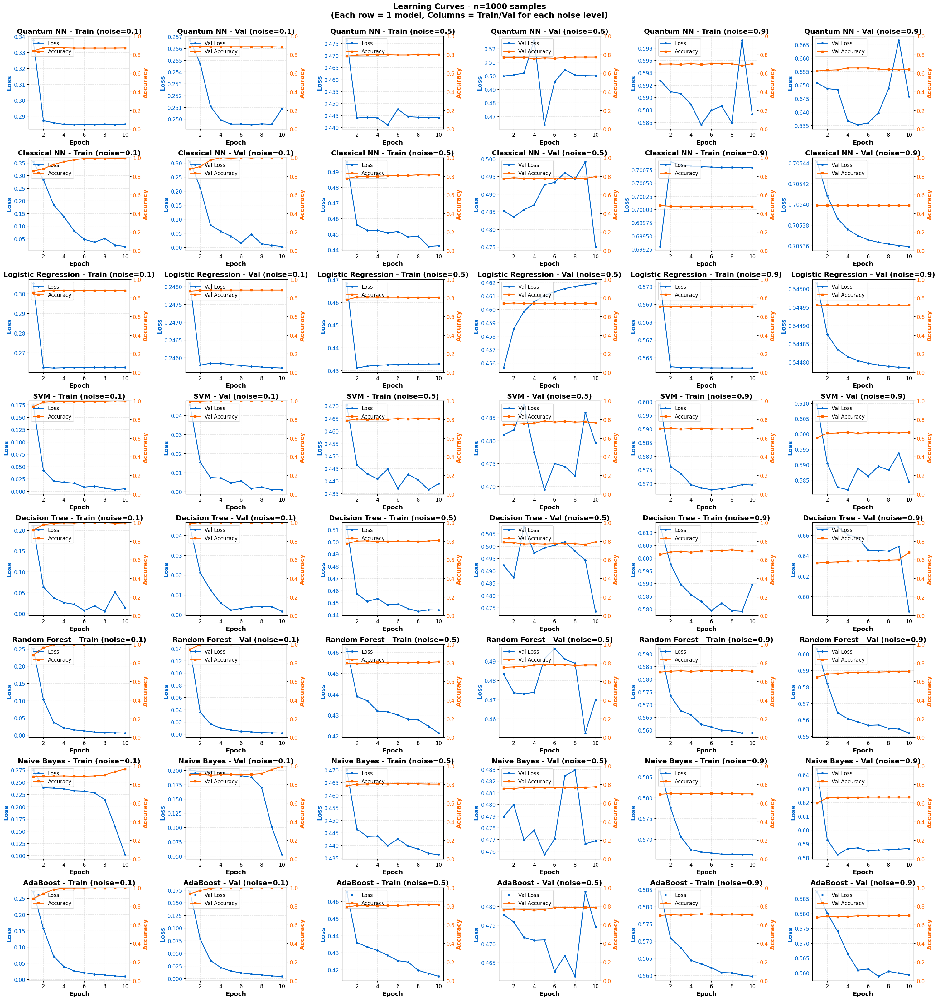

Saved: figures/learning_curves_n1000.png


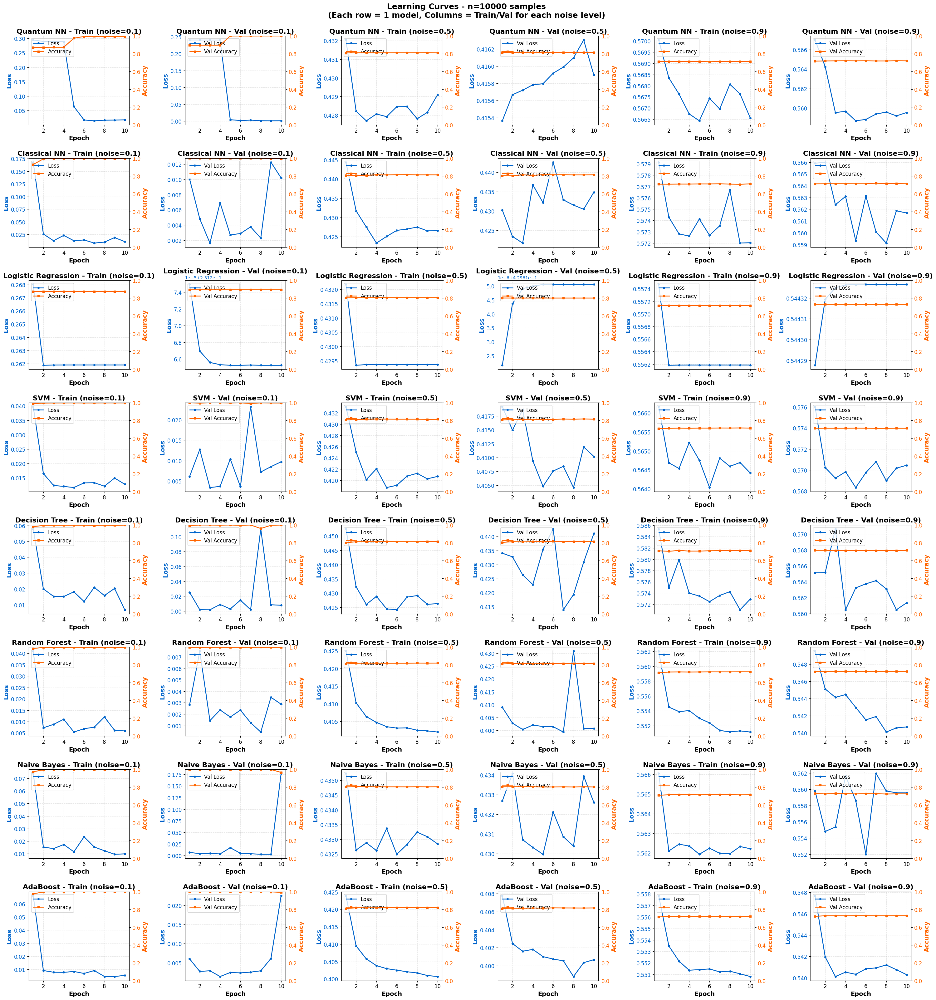

Saved: figures/learning_curves_n10000.png


In [ ]:
# Tham số font size
TITLE_FONTSIZE = 16
LABEL_FONTSIZE = 14
LEGEND_FONTSIZE = 12
TICK_FONTSIZE = 12

for n_samples in SAMPLE_SIZES:
    first_noise = NOISE_LEVELS[0]
    first_config = f"{n_samples}_noise{first_noise}"
    results = all_experiments[first_config]['results']
    
    models_with_history = [name for name in results.keys() 
                           if 'history' in results[name] and results[name]['history']]
    
    n_models = len(models_with_history)
    n_cols = len(NOISE_LEVELS) * 2  
    
    fig, axes = plt.subplots(n_models, n_cols, figsize=(5 * n_cols, 4 * n_models))
    if n_models == 1:
        axes = axes.reshape(1, -1)
    for model_idx, model_name in enumerate(models_with_history):
        for noise_idx, noise in enumerate(NOISE_LEVELS):
            config_name = f"{n_samples}_noise{noise}"
            history = all_experiments[config_name]['results'][model_name]['history']
            epochs_range = range(1, len(history['loss']) + 1)
            col_train = noise_idx * 2  
            col_val = noise_idx * 2 + 1 
            # Train plot
            ax_train = axes[model_idx, col_train]
            color_loss = "#0066CC"
            ax_train.set_xlabel('Epoch', fontsize=LABEL_FONTSIZE, fontweight='bold')
            ax_train.set_ylabel('Loss', fontsize=LABEL_FONTSIZE, fontweight='bold', color=color_loss)
            line1 = ax_train.plot(epochs_range, history['loss'], color=color_loss, linewidth=2, marker='o', markersize=4, label='Loss')
            ax_train.tick_params(axis='y', labelcolor=color_loss, labelsize=TICK_FONTSIZE)
            ax_train.tick_params(axis='x', labelsize=TICK_FONTSIZE)
            ax_train.grid(True, alpha=0.3, linestyle='--')
            # Plot training accuracy on secondary axis
            ax_train2 = ax_train.twinx()
            color_acc = "#FF6600"
            ax_train2.set_ylabel('Accuracy', fontsize=LABEL_FONTSIZE, fontweight='bold', color=color_acc)
            line2 = ax_train2.plot(epochs_range, history['accuracy'], color=color_acc, linewidth=2, marker='s', markersize=4, label='Accuracy')
            ax_train2.tick_params(axis='y', labelcolor=color_acc, labelsize=TICK_FONTSIZE)
            ax_train2.set_ylim([0, 1])
            # Title + legend
            ax_train.set_title(f'{model_name} - Train (noise={noise})', fontsize=TITLE_FONTSIZE, fontweight='bold')
            lines = line1 + line2
            labels = [l.get_label() for l in lines]
            ax_train.legend(lines, labels, loc='upper left', fontsize=LEGEND_FONTSIZE)
            
            # Validation plot
            ax_val = axes[model_idx, col_val]
            # Plot validation loss on primary axis
            ax_val.set_xlabel('Epoch', fontsize=LABEL_FONTSIZE, fontweight='bold')
            ax_val.set_ylabel('Loss', fontsize=LABEL_FONTSIZE, fontweight='bold', color=color_loss)
            line3 = ax_val.plot(epochs_range, history['val_loss'], color=color_loss, linewidth=2, marker='o', markersize=4, label='Val Loss')
            ax_val.tick_params(axis='y', labelcolor=color_loss, labelsize=TICK_FONTSIZE)
            ax_val.tick_params(axis='x', labelsize=TICK_FONTSIZE)
            ax_val.grid(True, alpha=0.3, linestyle='--')
            # Plot validation accuracy on secondary axis
            ax_val2 = ax_val.twinx()
            ax_val2.set_ylabel('Accuracy', fontsize=LABEL_FONTSIZE, fontweight='bold', color=color_acc)
            line4 = ax_val2.plot(epochs_range, history['val_accuracy'], color=color_acc, linewidth=2, marker='s', markersize=4, label='Val Accuracy')
            ax_val2.tick_params(axis='y', labelcolor=color_acc, labelsize=TICK_FONTSIZE)
            ax_val2.set_ylim([0, 1])
            # Title + legend
            ax_val.set_title(f'{model_name} - Val (noise={noise})', fontsize=TITLE_FONTSIZE, fontweight='bold')
            lines = line3 + line4
            labels = [l.get_label() for l in lines]
            ax_val.legend(lines, labels, loc='upper left', fontsize=LEGEND_FONTSIZE)
    
    plt.suptitle(f'Learning Curves - n={n_samples} samples\n(Each row = 1 model, Columns = Train/Val for each noise level)', fontsize=18, fontweight='bold', y=1.0)
    plt.tight_layout()
    plt.savefig(f'figures/learning_curves_n{n_samples}.png', dpi=300, bbox_inches='tight')
    plt.show()
    print(f"Saved: figures/learning_curves_n{n_samples}.png")

### Learning Curves Analysis
Visualize training and validation loss/accuracy over epochs to understand model convergence

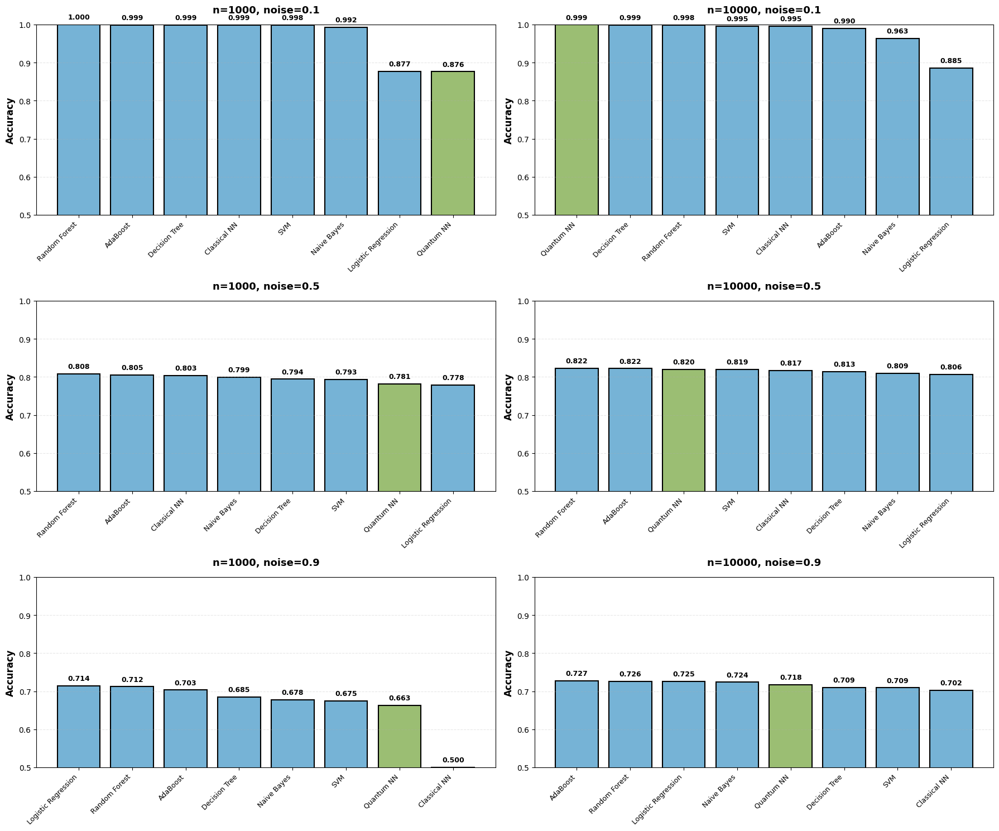

Saved: figures/accuracy_comparison.png


In [ ]:
fig, axes = plt.subplots(len(NOISE_LEVELS), len(SAMPLE_SIZES), figsize=(9 * len(SAMPLE_SIZES), 5 * len(NOISE_LEVELS)))

if len(NOISE_LEVELS) == 1 and len(SAMPLE_SIZES) == 1:
    axes = np.array([[axes]])
elif len(NOISE_LEVELS) == 1:
    axes = axes.reshape(1, -1)
elif len(SAMPLE_SIZES) == 1:
    axes = axes.reshape(-1, 1)

for noise_idx, noise in enumerate(NOISE_LEVELS):
    for size_idx, n_samples in enumerate(SAMPLE_SIZES):
        config_name = f"{n_samples}_noise{noise}"
        results = all_experiments[config_name]['results']
        
        model_names = list(results.keys())
        accuracies = [results[name]['accuracy'] for name in model_names]
        
        # Sort theo accuracy
        sorted_indices = np.argsort(accuracies)[::-1]
        model_names_sorted = [model_names[i] for i in sorted_indices]
        accuracies_sorted = [accuracies[i] for i in sorted_indices]
        colors = ["#9bbe73" if name == 'Quantum NN' else "#76b3d6" for name in model_names_sorted]
        
        ax = axes[noise_idx, size_idx]
        bars = ax.bar(range(len(model_names_sorted)), accuracies_sorted, color=colors, edgecolor='black', linewidth=1.5)
        ax.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
        ax.set_title(f'n={n_samples}, noise={noise}', fontsize=13, fontweight='bold', pad=15)
        ax.set_ylim([0.5, 1.0])
        ax.set_xticks(range(len(model_names_sorted)))
        ax.set_xticklabels(model_names_sorted, rotation=45, ha='right', fontsize=9)
        
        # Add value labels
        for i, (bar, acc) in enumerate(zip(bars, accuracies_sorted)):
            ax.text(bar.get_x() + bar.get_width()/2, bar.get_height() + 0.01,
                    f'{acc:.3f}', ha='center', va='bottom', fontweight='bold', fontsize=9)
        
        ax.grid(axis='y', alpha=0.3, linestyle='--')

plt.tight_layout()
plt.savefig('figures/accuracy_comparison.png', dpi=300, bbox_inches='tight')
plt.show()
print("Saved: figures/accuracy_comparison.png")


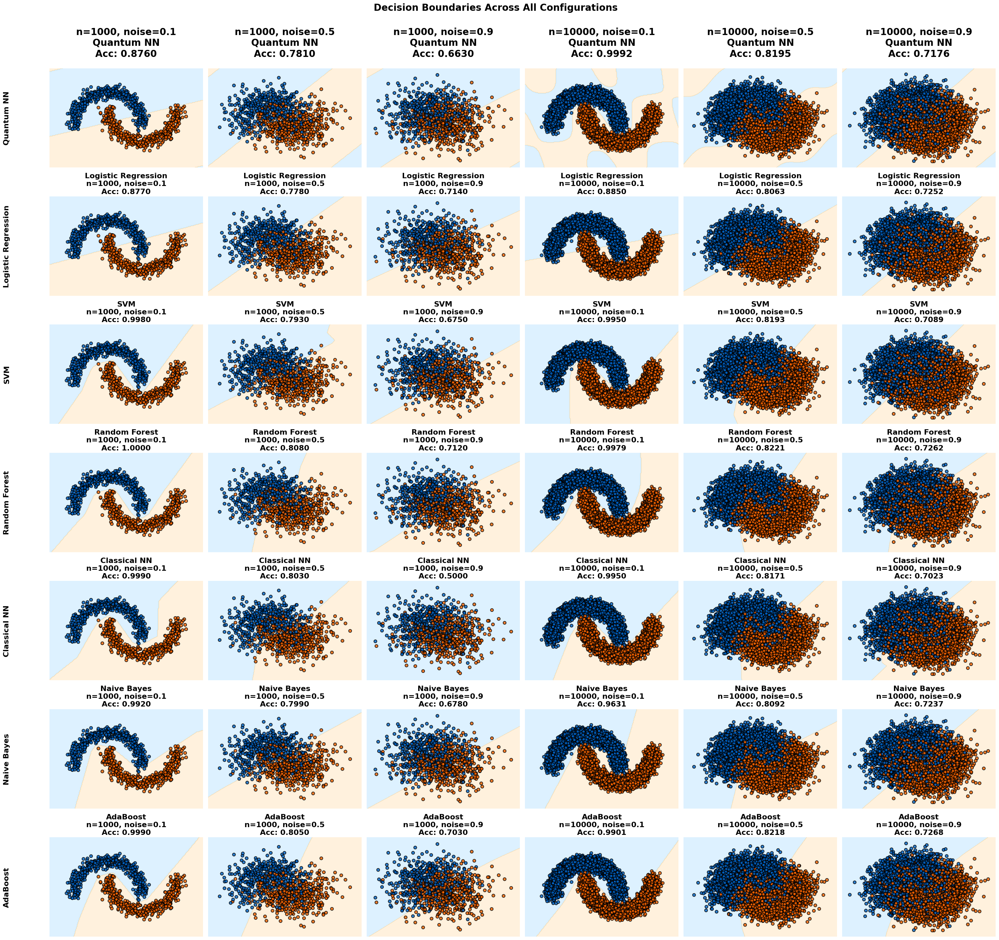

Saved: figures/decision_boundaries.png


In [ ]:
# Tham số font size
TITLE_FONTSIZE = 20
LABEL_FONTSIZE = 18
SUPTITLE_FONTSIZE = 20
BOUNDARY_TITLE_FONTSIZE = 16
ROW_LABEL_FONTSIZE = 16

def plot_decision_boundary(model, X, y, title, is_torch=False):
    h = 0.02  # step size in the mesh
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                         np.arange(y_min, y_max, h))
    
    # All models are now torch models
    with torch.no_grad():
        Z = model(torch.tensor(np.c_[xx.ravel(), yy.ravel()], dtype=torch.float32))
        Z = Z.argmax(dim=1).numpy()
    
    Z = Z.reshape(xx.shape)
    
    # Tạo color map
    cmap_light = ListedColormap(['#AADDFF', '#FFDDAA'])
    cmap_bold = ['#0066CC', '#FF6600']
    
    plt.contourf(xx, yy, Z, alpha=0.4, cmap=cmap_light)
    plt.scatter(X[:, 0], X[:, 1], c=[cmap_bold[int(yi)] for yi in y], 
                edgecolor='black', s=40, alpha=0.8, linewidths=1.5)
    plt.title(title, fontsize=BOUNDARY_TITLE_FONTSIZE, fontweight='bold')
    plt.axis('off')

model_names = ['Quantum NN', 'Logistic Regression', 'SVM', 
               'Random Forest', 'Classical NN', 'Naive Bayes', 'AdaBoost']
n_models = len(model_names)
n_configs = len(SAMPLE_SIZES) * len(NOISE_LEVELS)
fig, axes = plt.subplots(n_models, n_configs, figsize=(5 * n_configs, 4 * n_models))

if n_models == 1:
    axes = axes.reshape(1, -1)

for row_idx, model_name in enumerate(model_names):
    col_idx = 0
    for n_samples in SAMPLE_SIZES:
        for noise in NOISE_LEVELS:
            config_name = f"{n_samples}_noise{noise}"
            ax = axes[row_idx, col_idx]
            plt.sca(ax)
            
            # Get data and model 
            exp_data = all_experiments[config_name]
            X_all = exp_data['data'][2]
            Y_all = exp_data['data'][3]
            results = exp_data['results']
            # Get the model - all models are now torch models
            if model_name == 'Quantum NN': model = exp_data['qnn_model']
            else: model = exp_data['models'][model_name]
            # Get accuracy
            accuracy = results[model_name]['accuracy']
            # Plot decision boundary
            plot_decision_boundary(model, X_all, Y_all, f'{model_name}\nn={n_samples}, noise={noise}\nAcc: {accuracy:.4f}')            
            if row_idx == 0:
                ax.set_title(f'n={n_samples}, noise={noise}\n{model_name}\nAcc: {accuracy:.4f}', fontsize=TITLE_FONTSIZE, fontweight='bold', pad=25)
            if col_idx == 0:
                ax.text(-0.3, 0.5, model_name, transform=ax.transAxes, fontsize=ROW_LABEL_FONTSIZE, fontweight='bold', va='center', rotation=90)
            col_idx += 1

plt.suptitle('Decision Boundaries Across All Configurations', 
             fontsize=SUPTITLE_FONTSIZE, fontweight='bold', y=0.995)
plt.tight_layout(rect=[0.02, 0, 1, 0.99])
plt.savefig('figures/decision_boundaries.png', dpi=300, bbox_inches='tight')
plt.show()
print("Saved: figures/decision_boundaries.png")

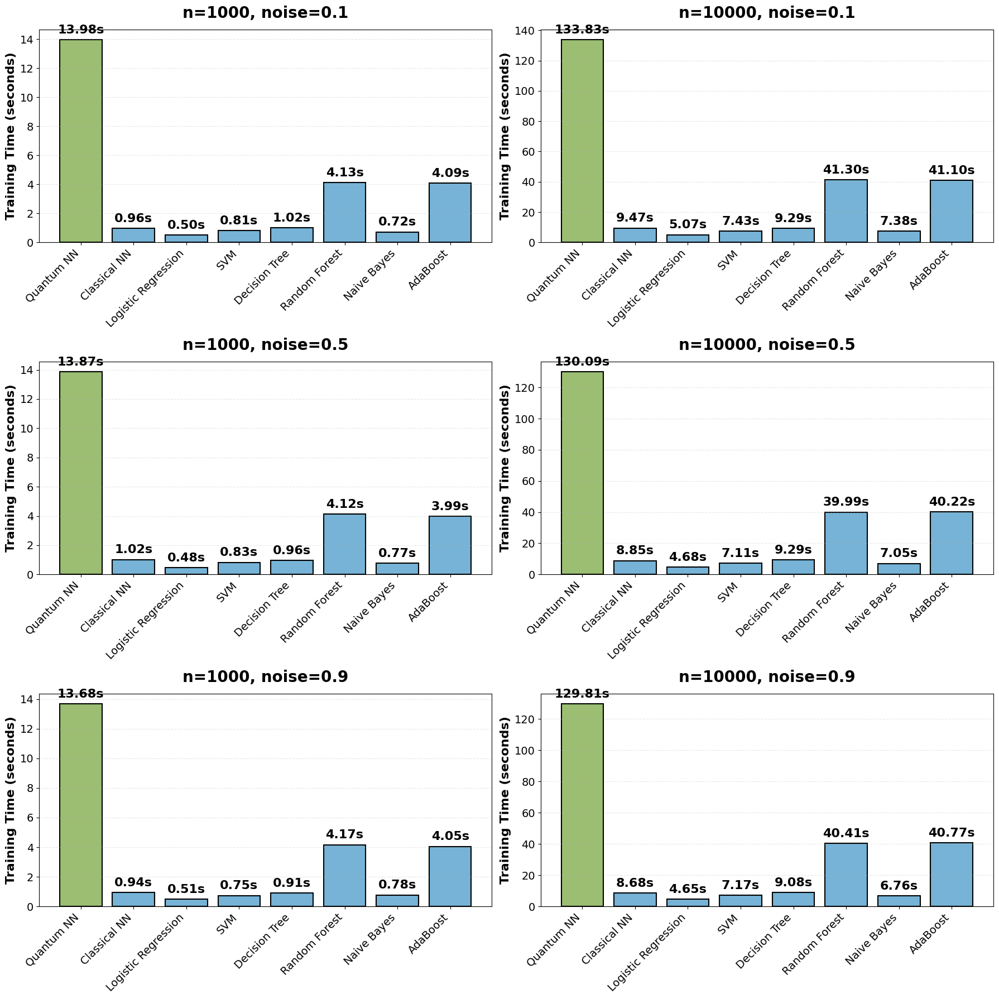

Saved: figures/training_time_comparison.png


In [ ]:
# Tham số font size
TITLE_FONTSIZE = 20
LABEL_FONTSIZE = 16
TICK_FONTSIZE = 14
VALUE_FONTSIZE = 16

fig, axes = plt.subplots(len(NOISE_LEVELS), len(SAMPLE_SIZES), figsize=(9 * len(SAMPLE_SIZES), 6 * len(NOISE_LEVELS)))
if len(NOISE_LEVELS) == 1 and len(SAMPLE_SIZES) == 1:
    axes = np.array([[axes]])
elif len(NOISE_LEVELS) == 1:
    axes = axes.reshape(1, -1)
elif len(SAMPLE_SIZES) == 1:
    axes = axes.reshape(-1, 1)

for noise_idx, noise in enumerate(NOISE_LEVELS):
    for size_idx, n_samples in enumerate(SAMPLE_SIZES):
        config_name = f"{n_samples}_noise{noise}"
        ax = axes[noise_idx, size_idx]
        exp_results = all_experiments[config_name]['results']
        
        model_names = list(exp_results.keys())
        times = [exp_results[name]['time'] for name in model_names]
        colors = ['#9bbe73' if name == 'Quantum NN' else '#76b3d6' for name in model_names]
        
        bars = ax.bar(range(len(model_names)), times, color=colors, edgecolor='black', linewidth=1.5)
        ax.set_xticks(range(len(model_names)))
        ax.set_xticklabels(model_names, rotation=45, ha='right', fontsize=TICK_FONTSIZE)
        ax.set_ylabel('Training Time (seconds)', fontsize=LABEL_FONTSIZE, fontweight='bold')
        ax.set_title(f'n={n_samples}, noise={noise}', fontsize=TITLE_FONTSIZE, fontweight='bold', pad=15)
        ax.tick_params(axis='y', labelsize=TICK_FONTSIZE)
        ax.grid(axis='y', alpha=0.3, linestyle='--')
        
        for bar, t in zip(bars, times):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2, height + max(times)*0.02, 
                    f'{t:.2f}s', ha='center', va='bottom', fontsize=VALUE_FONTSIZE, fontweight='bold')

plt.tight_layout()
plt.savefig('figures/training_time_comparison.png', dpi=300, bbox_inches='tight')
plt.show()
print("Saved: figures/training_time_comparison.png")